## Sentiment Analysis

In this notebook, we're going to learn how to use [VADER](https://github.com/cjhutto/vaderSentiment) (Valence Aware Dictionary and sEntiment Reasoner), a sentiment analysis tool designed for social media.

We're going to see how well VADER works with our own sentences and with sentences from *The House on Mango Street*. Can we create an accurate plot arc of Sandra Cisneros's coming-of-age novel?

---

## Install and Import Libraries/Packages

Import Pandas and set Pandas display column width to 400 characters

In [4]:
import pandas as pd
pd.options.display.max_colwidth = 400

Install vaderSentiment package with pip

In [10]:
!pip install vaderSentiment

     |████████████████████████████████| 125 kB 2.8 MB/s eta 0:00:01
You should consider upgrading via the '/Users/melaniewalsh/opt/anaconda3/bin/python3 -m pip install --upgrade pip' command.


Import the SentimentIntensityAnalyser and initlaize it

In [5]:
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
sentimentAnalyser = SentimentIntensityAnalyzer()

## Calculate Sentiment Scores

To calculate sentiment scores for a sentence or paragraph, we can use the `.polarity_scores()` method.

In [412]:
sentimentAnalyser.polarity_scores("I like the Marvel movies")

{'neg': 0.0, 'neu': 0.361, 'pos': 0.639, 'compound': 0.6486}

In [391]:
sentimentAnalyser.polarity_scores("I don't like the Marvel movies")

{'neg': 0.526, 'neu': 0.474, 'pos': 0.0, 'compound': -0.5334}

In [392]:
sentimentAnalyser.polarity_scores("I don't *not* like the Marvel movies")

{'neg': 0.255, 'neu': 0.546, 'pos': 0.199, 'compound': -0.1307}

## Your Turn!

Try out the `sentimentAnalyzer` on some sentences of your own!

Experiment with capitalization, punctuation, emojis, historical words, slangy language, poetry, or non-English words. How does VADER handle it? What does VADER seem to do well and not so well?

In [393]:
#Your code here

{'neg': 0.0, 'neu': 0.361, 'pos': 0.639, 'compound': 0.6486}

In [ ]:
#Your code here

## Calculate Sentiment Scores for *The House on Mango Street*

To calculate sentiment scores for *The House on Mango Street*, we first need a quick-and-easy way to break the novel up into sentences.

### Install and Import NLTK

Install [NLTK](https://www.nltk.org/), a Python library for text analysis natural language processing

In [266]:
!pip install nltk

You should consider upgrading via the '/Users/melaniewalsh/opt/anaconda3/bin/python3 -m pip install --upgrade pip' command.


Import nltk and download the model that will help us get sentences

In [6]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     /Users/melaniewalsh/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

### Load Text and Break Into Sentences

Read in the text file for "Hairs"

In [7]:
text_file = "../texts/literature/Pride-and-Prejudice_Jane-Austen.txt"
chapter = open(text_file, encoding="utf-8").read()

To break a string into individual sentences, we can use `nltk.sent_tokenize()`

In [8]:
nltk.sent_tokenize(chapter[:1000])

['\nPRIDE & PREJUDICE.',
 'CHAPTER I.',
 'It is a truth universally acknowledged, that a single man in possession\nof a good fortune, must be in want of a wife.',
 'However little known the feelings or views of such a man may be on his\nfirst entering a neighbourhood, this truth is so well fixed in the minds\nof the surrounding families, that he is considered as the rightful\nproperty of some one or other of their daughters.',
 '"My dear Mr. Bennet," said his lady to him one day, "have you heard that\nNetherfield Park is let at last?"',
 'Mr. Bennet replied that he had not.',
 '"But it is," returned she; "for Mrs. Long has just been here, and she\ntold me all about it."',
 'Mr. Bennet made no answer.',
 '"Do not you want to know who has taken it?"',
 'cried his wife impatiently.',
 '"_You_ want to tell me, and I have no objection to hearing it."',
 'This was invitation enough.',
 '"Why, my dear, you must know, Mrs. Long says that Netherfield is taken\nby a young man of large fortune fr

In [9]:
sentences = nltk.sent_tokenize(chapter[:1000])

### Calculate Scores for Each Sentence

We can loop through the sentences and calculate sentiment scores for every sentence.

*How would we print just the "compound" score for each sentence?*

In [10]:
for sentence in sentences:
    scores = sentimentAnalyser.polarity_scores(sentence)
    
    print(sentence, '\n', scores, '\n')


PRIDE & PREJUDICE. 
 {'neg': 0.494, 'neu': 0.122, 'pos': 0.384, 'compound': -0.2263} 

CHAPTER I. 
 {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0} 

It is a truth universally acknowledged, that a single man in possession
of a good fortune, must be in want of a wife. 
 {'neg': 0.0, 'neu': 0.755, 'pos': 0.245, 'compound': 0.6705} 

However little known the feelings or views of such a man may be on his
first entering a neighbourhood, this truth is so well fixed in the minds
of the surrounding families, that he is considered as the rightful
property of some one or other of their daughters. 
 {'neg': 0.0, 'neu': 0.902, 'pos': 0.098, 'compound': 0.6147} 

"My dear Mr. Bennet," said his lady to him one day, "have you heard that
Netherfield Park is let at last?" 
 {'neg': 0.0, 'neu': 0.885, 'pos': 0.115, 'compound': 0.3818} 

Mr. Bennet replied that he had not. 
 {'neg': 0.0, 'neu': 1.0, 'pos': 0.0, 'compound': 0.0} 

"But it is," returned she; "for Mrs. Long has just been here, and sh

### Make DataFrame

A convenient way to create a DataFrame is to make a list of dictionaries.

Below we loop through the sentences, calculate sentiment scores, and then create a mini-dictionary with the sentence and the compound score, which we append to the list `sentence_scores`.

In [11]:
sentence_scores = []
for sentence in sentences:
    scores = sentimentAnalyser.polarity_scores(sentence)
    sentence_scores.append({'sentence': sentence, 'score': scores['compound']})

To make this list of dictionaries into a DataFrame, we can simply use `pd.DataFrame()`

In [12]:
pd.DataFrame(sentence_scores)

,sentence,score
0,\nPRIDE & PREJUDICE.,-0.2263
1,CHAPTER I.,0.0000
2,"It is a truth universally acknowledged, that a single man in possession\nof a good fortune, must be in want of a wife.",0.6705
3,"However little known the feelings or views of such a man may be on his\nfirst entering a neighbourhood, this truth is so well fixed in the minds\nof the surrounding families, that he is considered as the rightful\nproperty of some one or other of their daughters.",0.6147
4,"""My dear Mr. Bennet,"" said his lady to him one day, ""have you heard that\nNetherfield Park is let at last?""",0.3818
5,Mr. Bennet replied that he had not.,0.0000
6,"""But it is,"" returned she; ""for Mrs. Long has just been here, and she\ntold me all about it.""",0.0000
7,Mr. Bennet made no answer.,-0.2960
8,"""Do not you want to know who has taken it?""",-0.0572
9,cried his wife impatiently.,-0.6486


Let's examine the sentences from negative to positive sentiment scores.

In [13]:
pp_df = pd.DataFrame(sentence_scores)
pp_df.sort_values(by='score')

,sentence,score
9,cried his wife impatiently.,-0.6486
7,Mr. Bennet made no answer.,-0.2960
0,\nPRIDE & PREJUDICE.,-0.2263
10,"""_You_ want to tell me, and I have no objection to hearing it.""",-0.2263
8,"""Do not you want to know who has taken it?""",-0.0572
1,CHAPTER I.,0.0000
5,Mr. Bennet replied that he had not.,0.0000
6,"""But it is,"" returned she; ""for Mrs. Long has just been here, and she\ntold me all about it.""",0.0000
11,This was invitation enough.,0.0000
4,"""My dear Mr. Bennet,"" said his lady to him one day, ""have you heard that\nNetherfield Park is let at last?""",0.3818


### Calculate Sentiment Scores By Chapter

To calculate sentiment scores for the sentences in each chapter of *The House on Mango Street*, we need to read in each file indviidually.

Here we will import `glob` and `Path`, which allow us to get all the filenames for the chapters and extract the titles.

In [81]:
import glob
from pathlib import Path

Create a list of filenames for every `.txt` file in the directory

In [327]:
directory_path = "../texts/literature/House-on-Mango-Street/"
text_files = glob.glob(f"{directory_path}/*.txt")

In [ ]:
Loop through each file in the "House on Mango Street" directory, 

In [332]:
sentence_scores = []

# Loop through all the filenames
for text_file in text_files:
    
    #Read in the file
    chapter = open(text_file, encoding="utf-8").read()
    #Extract the end of the filename
    title = Path(text_file).stem
    
    #Loop through each sentence in the 
    for sentence in nltk.sent_tokenize(chapter):
        #Calculate sentiment scores for sentence
        scores = sentimentAnalyser.polarity_scores(sentence)
        
        #Make mini-dictionary with chapter name, sentence, and sentiment score
        sentence_scores.append({'chapter': title,
                                'sentence': sentence,
                                'score': scores['compound']})

Let's create a DataFrame from all these sentences

In [340]:
chapter_df = pd.DataFrame(sentence_scores)
# Make the DataFrame alphabetical by chapter
chapter_df = chapter_df.sort_values(by='chapter')

How would we examine the most negative 15 sentences?

In [421]:
chapter_df.sort_values(by='score')[:15]

,chapter,sentence,score,rolling_mean
1028,17-The-Family-of-Little-Feet,"Bum man is yelling something to the air but by now we are running fast and far away, our high heel shoes taking us all the way down the avenue and around the block, past the ugly cousins, past Mr. Benny’s, up Mango Street, the back way, just in case.",-0.8519,0.085570
0,23-Born-Bad,Born Bad\n\n\nMost likely I will go to hell and most likely I deserve to be there.,-0.8442,-0.032880
1305,22-Papa-Who-Wakes-Up-Tired-in-the-Dark,"Papa\n\nWho Wakes Up\n\nTired\n\nin the Dark\n\n\nYour abuelito is dead, Papa says early one morning in my room.",-0.8020,0.115703
173,12-Those-Who-Don’t,They are stupid people who are lost and got here by mistake.,-0.7964,0.052530
426,13-There-Was-an-Old-Woman-She-Had-So-Many-Children-She-Didn’t-Know-What-to-Do,But after a while you get tired of being worried about kids who aren’t even yours.,-0.7684,-0.010923
315,16-And-Some-More,"Anita, Stella, Dennis, and Lolo …\n\nWho you calling ugly, ugly?",-0.7650,0.136313
565,18-A-Rice-Sandwich,"she said, pointing to a row of ugly three-flats, the ones even the raggedy men are ashamed to go into.",-0.7506,0.050130
422,13-There-Was-an-Old-Woman-She-Had-So-Many-Children-She-Didn’t-Know-What-to-Do,"They are bad those Vargases, and how can they help it with only one mother who is tired all the time from buttoning and bottling and babying, and who cries every day for the man who left without even leaving a dollar for bologna or a note explaining how come.",-0.7506,-0.020310
47,23-Born-Bad,I hated to go there alone.,-0.7351,-0.102603
957,06-Our-Good-Day,"Past my house, sad and red and crumbly in places, past Mr. Benny’s grocery on the corner, and down the avenue which is dangerous.",-0.7351,0.130330


How would we examine the most positive 15 sentences?

## Full Text

In [14]:
import re

In [86]:
trump_tweets = pd.read_csv('../texts/politics/Trump-Tweets.csv')

In [90]:
sentiment_scores = []
for tweet in trump_tweets['text']:
    scores = sentimentAnalyser.polarity_scores(tweet)
    sentiment_scores.append(scores['compound'])

In [91]:
trump_tweets['sentiment_score'] = sentiment_scores

In [87]:
trump_tweets['date'] = pd.to_datetime(trump_tweets['created_at'])
trump_tweets['year'] = pd.to_datetime(trump_tweets['date'].dt.year, format='%Y')
#trump_tweets['year-month'] = trump_tweets['date'].dt.to_period('M')
#trump_tweets['Date (by month)'] = [month.to_timestamp() for month in trump_tweets['year-month']]


In [53]:
trump_tweets = trump_tweets.set_index('Date (by month)')


In [93]:
trump_tweets['rolling_mean'] = trump_tweets['sentiment_score'].rolling(50).mean()

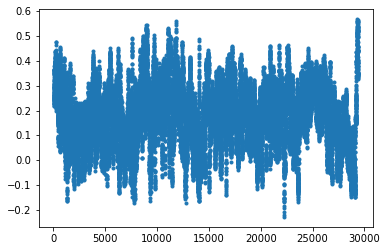

In [94]:
trump_tweets['rolling_mean'].plot(style='.')

In [76]:
import altair as alt

In [88]:
trump_tweets

,source,text,created_at,retweet_count,favorite_count,is_retweet,id_str,date,year
0,Twitter for iPhone,Just finished a very good conversation with President Xi of China. Discussed in great detail the CoronaVirus that is ravaging large parts of our Planet. China has been through much &amp; has developed a strong understanding of the Virus. We are working closely together. Much respect!,03-27-2020 05:19:02,33074,202087,False,1243407157321560000,2020-03-27 05:19:02,2020-01-01
1,Twitter for iPhone,Will be interviewed on @seanhannity at 9:10 P.M. @FoxNews,03-27-2020 01:05:59,7419,42186,False,1243343475799720000,2020-03-27 01:05:59,2020-01-01
2,Twitter for iPhone,The world is at war with a hidden enemy. WE WILL WIN! https://t.co/QLceNWcL6Z,03-26-2020 23:50:02,24472,97346,False,1243324360523490000,2020-03-26 23:50:02,2020-01-01
3,Twitter for iPhone,Our great Oil &amp; Gas industry is under under seige after having one of the best years in recorded history. It will get better than ever as soon as our Country starts up again. Vital that it does for our National Security!,03-26-2020 23:06:28,25514,131210,False,1243313399284500000,2020-03-26 23:06:28,2020-01-01
4,Twitter for iPhone,Will be going out in 10 minutes for the press conference.,03-26-2020 20:57:15,15797,130201,False,1243280878991790000,2020-03-26 20:57:15,2020-01-01
...,...,...,...,...,...,...,...,...,...
29390,Twitter Web Client,My persona will never be that of a wallflower - I’d rather build walls than cling to them --Donald J. Trump,05-12-2009 14:07:28,1421,1950,False,1773561338,2009-05-12 14:07:28,2009-01-01
29391,Twitter Web Client,New Blog Post: Celebrity Apprentice Finale and Lessons Learned Along the Way: http://tinyurl.com/qlux5e,05-08-2009 20:40:15,8,27,False,1741160716,2009-05-08 20:40:15,2009-01-01
29392,Twitter Web Client,Donald Trump reads Top Ten Financial Tips on Late Show with David Letterman: http://tinyurl.com/ooafwn - Very funny!,05-08-2009 13:38:08,3,2,False,1737479987,2009-05-08 13:38:08,2009-01-01
29393,Twitter Web Client,Donald Trump will be appearing on The View tomorrow morning to discuss Celebrity Apprentice and his new book Think Like A Champion!,05-05-2009 01:00:10,2,3,False,1701461182,2009-05-05 01:00:10,2009-01-01


In [84]:
alt.data_transformers.disable_max_rows()


DataTransformerRegistry.enable('default')

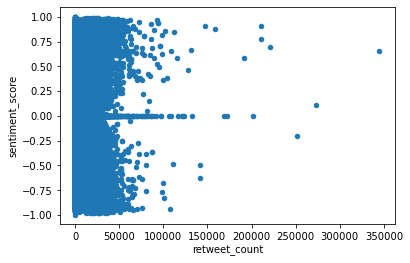

In [112]:
trump_tweets.plot(y='sentiment_score', x='retweet_count', kind='scatter')

In [108]:
alt.Chart(trump_tweets).mark_circle(size=10).encode(
    x='date',
    y='rolling_mean',
    color=alt.Color('rolling_mean', scale = alt.Scale(domain=[-.2, 0, .5],
                                                         range=['red', 'lightblue', 'darkblue'],type='linear')),
    tooltip=['text', 'sentiment_score']).interactive()

alt.Chart(...)

In [ ]:
alt.Chart(trump_tweets)

In [49]:
trump_tweets.sort_values(by='sentiment_score')[:15]

,source,text,created_at,retweet_count,favorite_count,is_retweet,id_str,sentiment_score
27365,TwitLonger Beta,"It's disgraceful that the Obama Administration's first response was not to condemn attacks on our diplomatic (cont) http://t.co/NNyJdQGy,09-12-2012 19:40:04,186,28,false,245970051230998530\nTwitter Web Client,So Obama can host the Muslim Brotherhood Pres. Morsi in the White House http://t.co/WKhZV1Op but doesn't have time for @netanyahu?,09-12-2012 19:18:50,867,107,false,245964708111331329\nT...",09-11-2012 19:58:44,199,50,False,245612360818122752\nTwitter Web Client,-0.9943
9404,Twitter for iPhone,It is outrageous that Poisonous Synthetic Heroin Fentanyl comes pouring into the U.S. Postal System from China. We can and must END THIS NOW! The Senate should pass the STOP ACT – and firmly STOP this poison from killing our children and destroying our country. No more delay!,08-20-2018 17:14:59,28452,104181,False,1031590431379870000,-0.9825
9472,Twitter for iPhone,The Rigged Russian Witch Hunt goes on and on as the “originators and founders” of this scam continue to be fired and demoted for their corrupt and illegal activity. All credibility is gone from this terrible Hoax and much more will be lost as it proceeds. No Collusion!,08-15-2018 14:08:18,19234,78501,False,1029731513573820000,-0.9785
8254,Twitter for iPhone,At the request of many I will be reviewing the case of a “U.S. Military hero” Major Matt Golsteyn who is charged with murder. He could face the death penalty from our own government after he admitted to killing a Terrorist bomb maker while overseas. @PeteHegseth @FoxNews,12-16-2018 15:03:22,26065,99394,False,1074319076766430000,-0.9783
3865,Twitter for iPhone,...But most importantly @CNN is bad for the USA. Their International Division spews bad information &amp; Fake News all over the globe. This is why foreign leaders are always asking me “Why does the Media hate the U.S. sooo much?” It is a fraudulent shame &amp; all comes from the top!,09-09-2019 13:01:41,12348,50077,False,1171046015106990000,-0.9773
6288,Twitter for iPhone,....employment numbers ever low taxes &amp; regulations a rebuilt military &amp; V.A. many great new judges &amp; so much more. But we have had a giant SCAM perpetrated upon our nation a Witch Hunt a Treasonous Hoax. That is the Constitutional Crisis &amp; hopefully guilty people will pay!,05-12-2019 21:35:41,17190,72618,False,1127688824409260000,-0.9771
7457,Twitter for iPhone,...said was a total lie but Fake Media won’t show it. I am an innocent man being persecuted by some very bad conflicted &amp; corrupt people in a Witch Hunt that is illegal &amp; should never have been allowed to start - And only because I won the Election! Despite this great success!,03-03-2019 15:44:10,26410,123059,False,1102233209708930000,-0.9765
10359,Twitter for iPhone,DOJ just issued the McCabe report - which is a total disaster. He LIED! LIED! LIED! McCabe was totally controlled by Comey - McCabe is Comey!! No collusion all made up by this den of thieves and lowlifes!,04-13-2018 19:36:27,36632,126817,False,984877999718896000,-0.9764
7965,Twitter for iPhone,The Trump portrait of an unsustainable Border Crisis is dead on. “In the last two years ICE officers made 266000 arrests of aliens with Criminal Records including those charged or convicted of 100000 assaults 30000 sex crimes &amp; 4000 violent killings.” America’s Southern....,01-14-2019 03:12:34,21646,81412,False,1084649448003790000,-0.9747
9416,Twitter for iPhone,....and have demanded transparency so that this Rigged and Disgusting Witch Hunt can come to a close. So many lives have been ruined over nothing - McCarthyism at its WORST! Yet Mueller &amp; his gang of Dems refuse to look at the real crimes on the other side - Media is even worse!,08-19-2018 11:15:12,19915,80789,False,1031137499995930000,-0.9745


In [15]:
text_file = "../texts/literature/Pride-and-Prejudice_Jane-Austen.txt"
text = open(text_file, encoding="utf-8").read()
text = text.replace('\n', ' ')

#chapter_titles = re.findall("CHAPTER [A-Z]{1,6}.", text)
chapters = re.split("CHAPTER [A-Z]{1,6}.", text)

chapters = chapters[1:]

sentence_scores = []

for chapter_number, chapter in enumerate(chapters):

    for sentence in nltk.sent_tokenize(chapter):
        
        scores = sentimentAnalyser.polarity_scores(sentence)
        sentence_scores.append({'chapter': 'Chapter {:02d}'.format(chapter_number+1),
                                'sentence': sentence,
                                'score': scores['compound'],})

In [16]:
novel_df = pd.DataFrame(sentence_scores)
novel_df.sort_index()

,chapter,sentence,score
0,Chapter 01,"It is a truth universally acknowledged, that a single man in possession of a good fortune, must be in want of a wife.",0.6705
1,Chapter 01,"However little known the feelings or views of such a man may be on his first entering a neighbourhood, this truth is so well fixed in the minds of the surrounding families, that he is considered as the rightful property of some one or other of their daughters.",0.6147
2,Chapter 01,"""My dear Mr. Bennet,"" said his lady to him one day, ""have you heard that Netherfield Park is let at last?""",0.3818
3,Chapter 01,Mr. Bennet replied that he had not.,0.0000
4,Chapter 01,"""But it is,"" returned she; ""for Mrs. Long has just been here, and she told me all about it.""",0.0000
...,...,...,...
5794,Chapter 61,"By Elizabeth's instructions she began to comprehend that a woman may take liberties with her husband, which a brother will not always allow in a sister more than ten years younger than himself.",0.3887
5795,Chapter 61,"Lady Catherine was extremely indignant on the marriage of her nephew; and as she gave way to all the genuine frankness of her character, in her reply to the letter which announced its arrangement, she sent him language so very abusive, especially of Elizabeth, that for some time all intercourse was at an end.",-0.8344
5796,Chapter 61,"But at length, by Elizabeth's persuasion, he was prevailed on to overlook the offence, and seek a reconciliation; and, after a little farther resistance on the part of his aunt, her resentment gave way, either to her affection for him, or her curiosity to see how his wife conducted herself; and she condescended to wait on them at Pemberley, in spite of that pollution which its woods had receiv...",-0.7684
5797,Chapter 61,"With the Gardiners, they were always on the most intimate terms.",0.0000


In [17]:
novel_df.sort_values(by='score')[:15]

,chapter,sentence,score
1899,Chapter 24,"""I am far from attributing any part of Mr. Bingley's conduct to design,"" said Elizabeth; ""but without scheming to do wrong, or to make others unhappy, there may be error, and there may be misery.",-0.9549
2873,Chapter 36,"It soothed, but it could not console her for the contempt which had been thus self-attracted by the rest of her family;--and as she considered that Jane's disappointment had in fact been the work of her nearest relations, and reflected how materially the credit of both must be hurt by such impropriety of conduct, she felt depressed beyond any thing she had ever known before.",-0.9520
604,Chapter 08,"Mrs. Hurst and Miss Bingley both cried out against the injustice of her implied doubt, and were both protesting that they knew many women who answered this description, when Mr. Hurst called them to order, with bitter complaints of their inattention to what was going forward.",-0.9493
2866,Chapter 36,"But vanity, not love, has been my folly.--Pleased with the preference of one, and offended by the neglect of the other, on the very beginning of our acquaintance, I have courted prepossession and ignorance, and driven reason away, where either were concerned.",-0.9490
1191,Chapter 16,"""I had not thought Mr. Darcy so bad as this--though I have never liked him, I had not thought so very ill of him--I had supposed him to be despising his fellow-creatures in general, but did not suspect him of descending to such malicious revenge, such injustice, such inhumanity as this!""",-0.9482
3963,Chapter 47,"Mrs. Bennet, to whose apartment they all repaired, after a few minutes conversation together, received them exactly as might be expected; with tears and lamentations of regret, invectives against the villanous conduct of Wickham, and complaints of her own sufferings and ill usage; blaming every body but the person to whose ill judging indulgence the errors of her daughter must be principally o...",-0.9319
1520,Chapter 19,"But the fact is, that being, as I am, to inherit this estate after the death of your honoured father, (who, however, may live many years longer,) I could not satisfy myself without resolving to chuse a wife from among his daughters, that the loss to them might be as little as possible, when the melancholy event takes place--which, however, as I have already said, may not be for several years.",-0.9306
1158,Chapter 16,"We are not on friendly terms, and it always gives me pain to meet him, but I have no reason for avoiding _him_ but what I might proclaim to all the world; a sense of very great ill usage, and most painful regrets at his being what he is.",-0.9306
2791,Chapter 35,"His resentment was in proportion to the distress of his circumstances--and he was doubtless as violent in his abuse of me to others, as in his reproaches to myself.",-0.9260
1306,Chapter 18,"Mr. Collins, awkward and solemn, apologising instead of attending, and often moving wrong without being aware of it, gave her all the shame and misery which a disagreeable partner for a couple of dances can give.",-0.9231


In [18]:
novel_df.sort_values(by='score', ascending=False)[:15]

,chapter,sentence,score
1794,Chapter 23,"After discharging his conscience on that head, he proceeded to inform them, with many rapturous expressions, of his happiness in having obtained the affection of their amiable neighbour, Miss Lucas, and then explained that it was merely with the view of enjoying her society that he had been so ready to close with their kind wish of seeing him again at Longbourn, whither he hoped to be able to ...",0.9853
1700,Chapter 21,"But, my dearest Jane, you cannot seriously imagine that because Miss Bingley tells you her brother greatly admires Miss Darcy, he is in the smallest degree less sensible of _your_ merit than when he took leave of you on Tuesday, or that it will be in her power to persuade him that instead of being in love with you, he is very much in love with her friend.""",0.9832
1462,Chapter 18,"""If I,"" said Mr. Collins, ""were so fortunate as to be able to sing, I should have great pleasure, I am sure, in obliging the company with an air; for I consider music as a very innocent diversion, and perfectly compatible with the profession of a clergyman.--I do not mean however to assert that we can be justified in devoting too much of our time to music, for there are certainly other things ...",0.9816
1761,Chapter 22,"The possibility of Mr. Collins's fancying himself in love with her friend had once occurred to Elizabeth within the last day or two; but that Charlotte could encourage him, seemed almost as far from possibility as that she could encourage him herself, and her astonishment was consequently so great as to overcome at first the bounds of decorum, and she could not help crying out, ""Engaged to Mr...",0.9804
1390,Chapter 18,"Mr. Bingley does not know the whole of his history, and is quite ignorant of the circumstances which have principally offended Mr. Darcy; but he will vouch for the good conduct, the probity and honour of his friend, and is perfectly convinced that Mr. Wickham has deserved much less attention from Mr. Darcy than he has received; and I am sorry to say that by his account as well as his sister's,...",0.9790
1707,Chapter 21,"""But, my dear sister, can I be happy, even supposing the best, in accepting a man whose sisters and friends are all wishing him to marry elsewhere?""",0.9780
980,Chapter 13,"--My mind however is now made up on the subject, for having received ordination at Easter, I have been so fortunate as to be distinguished by the patronage of the Right Honourable Lady Catherine de Bourgh, widow of Sir Lewis de Bourgh, whose bounty and beneficence has preferred me to the valuable rectory of this parish, where it shall be my earnest endeavour to de...",0.9767
1911,Chapter 24,"They may wish many things besides his happiness; they may wish his increase of wealth and consequence; they may wish him to marry a girl who has all the importance of money, great connections, and pride.""",0.9756
2142,Chapter 27,"His present pursuit could not make him forget that Elizabeth had been the first to excite and to deserve his attention, the first to listen and to pity, the first to be admired; and in his manner of bidding her adieu, wishing her every enjoyment, reminding her of what she was to expect in Lady Catherine de Bourgh, and trusting their opinion of her--their opinion of every body--would always coi...",0.9755
306,Chapter 06,"It was generally evident whenever they met, that he _did_ admire her; and to _her_ it was equally evident that Jane was yielding to the preference which she had begun to entertain for him from the first, and was in a way to be very much in love; but she considered with pleasure that it was not likely to be discovered by the world in general, since Jane united with great strength of feeling, a ...",0.9752


In [19]:
import matplotlib.pyplot as plt

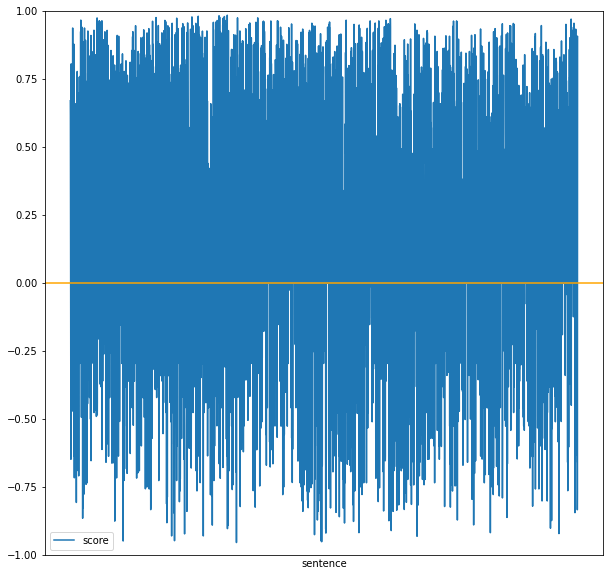

In [20]:
novel_df.plot(x='sentence', y='score', figsize=(10,10), ylim=[-1,1])

# Plot a horizontal line at 0
plt.axhline(y=0, color='orange', linestyle='-')

# Remove the x label and tick labels
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)

In [23]:
novel_df['rolling_mean'] = novel_df['score'].rolling(60).mean()

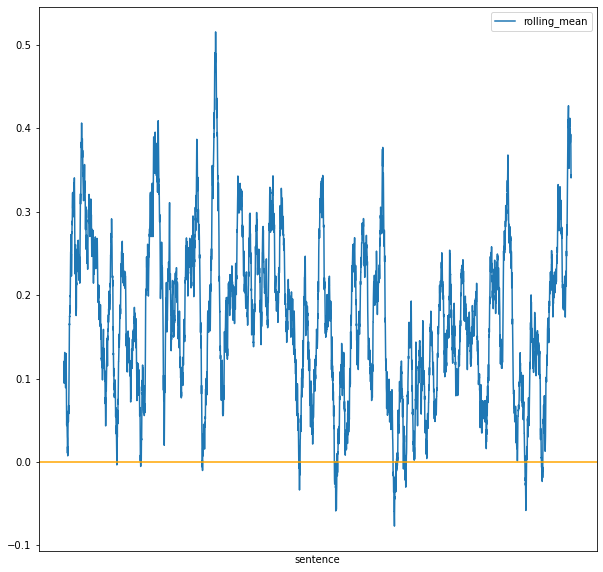

In [24]:
novel_df.plot(x='sentence', y='rolling_mean', figsize=(10,10))

# Plot a horizontal line at 0
plt.axhline(y=0, color='orange', linestyle='-')

# Remove the x label and tick labels
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)

### Make a Plot Arc

In [25]:
novel_df.groupby('chapter')['score'].mean()

chapter
Chapter 01    0.118525
Chapter 02    0.095994
Chapter 03    0.261183
Chapter 04    0.400866
Chapter 05    0.236547
                ...   
Chapter 57    0.131763
Chapter 58    0.087408
Chapter 59    0.241531
Chapter 60    0.263375
Chapter 61    0.300076
Name: score, Length: 61, dtype: float64

In [26]:
chapter_means = novel_df.groupby('chapter')['score'].mean().reset_index()

#### Bar Chart

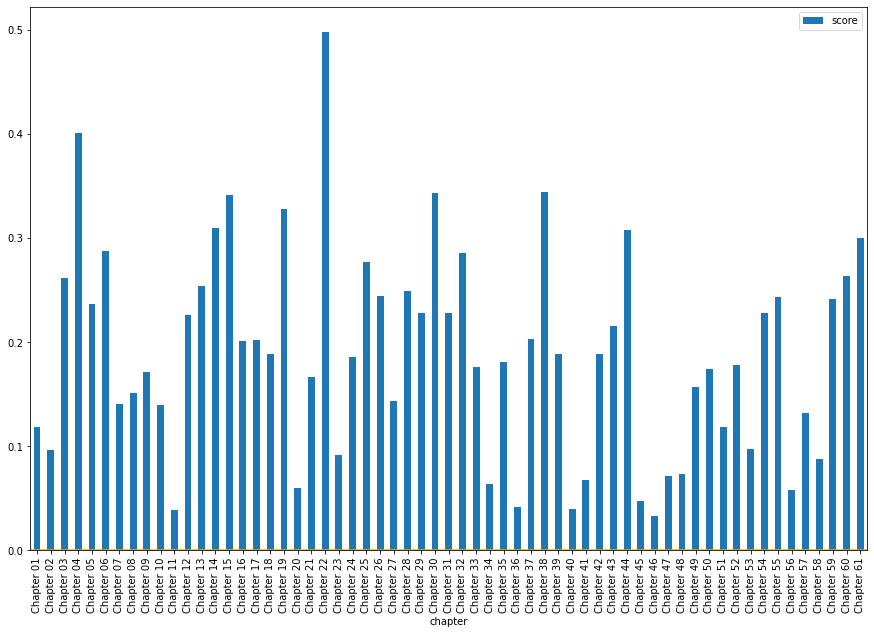

In [27]:
ax = chapter_means.plot(x='chapter', y='score',
                          kind='bar', figsize=(15,10),rot=90)

# Plot a horizontal line at 0
plt.axhline(y=0, color='orange', linestyle='-')

#### Line Chart

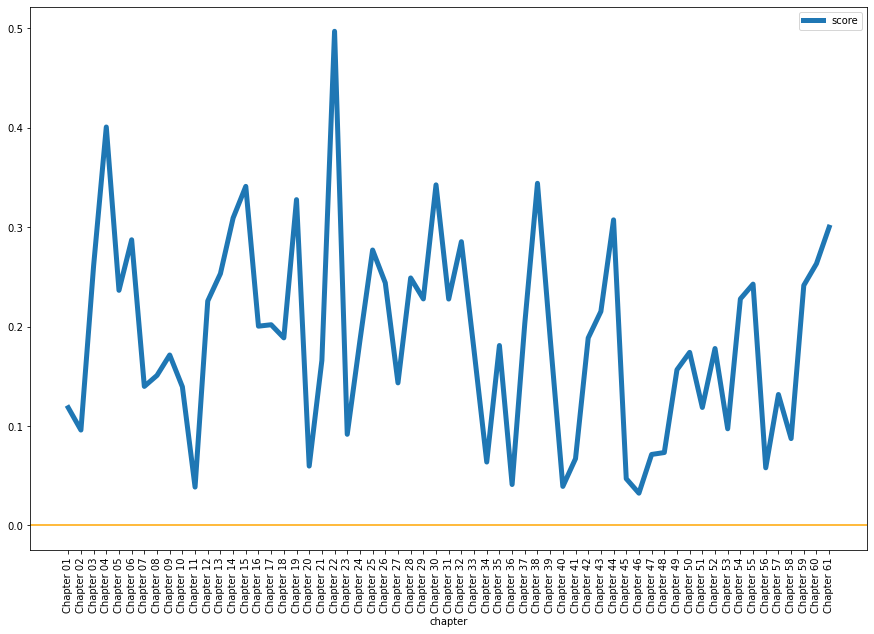

In [114]:
ax = chapter_means.plot(x='chapter', y='score', figsize=(15,10), rot=90, linewidth=5)

number_of_chapters = 61
#Not all xtick labels will show up in a line plot by default, so we have to make it explicit
ax.set_xticks(range(0, number_of_chapters))
ax.set_xticklabels(chapter_means['chapter'].unique())

# Plot a horizontal line at 0
plt.axhline(y=0, color='orange', linestyle='-')
plt.show()

In [38]:
novel_df[novel_df['chapter'].str.contains('22')].sort_index()[-20:]

,chapter,sentence,score,rolling_mean
1756,Chapter 22,With proper civilities the ladies then withdrew; all of them equally surprised to find that he meditated a quick return.,0.2263,0.393570
1757,Chapter 22,"Mrs. Bennet wished to understand by it that he thought of paying his addresses to one of her younger girls, and Mary might have been prevailed on to accept him.",0.3818,0.389318
1758,Chapter 22,"She rated his abilities much higher than any of the others; there was a solidity in his reflections which often struck her, and though by no means so clever as herself, she thought that if encouraged to read and improve himself by such an example as her's, he might become a very agreeable companion.",0.8620,0.403685
1759,Chapter 22,"But on the following morning, every hope of this kind was done away.",0.8573,0.418935
1760,Chapter 22,"Miss Lucas called soon after breakfast, and in a private conference with Elizabeth related the event of the day before.",-0.1531,0.399997
1761,Chapter 22,"The possibility of Mr. Collins's fancying himself in love with her friend had once occurred to Elizabeth within the last day or two; but that Charlotte could encourage him, seemed almost as far from possibility as that she could encourage him herself, and her astonishment was consequently so great as to overcome at first the bounds of decorum, and she could not help crying out, ""Engaged to Mr...",0.9804,0.409997
1762,Chapter 22,"my dear Charlotte,--impossible!""",0.4389,0.428398
1763,Chapter 22,"The steady countenance which Miss Lucas had commanded in telling her story, gave way to a momentary confusion here on receiving so direct a reproach; though, as it was no more than she expected, she soon regained her composure, and calmly replied, ""Why should you be surprised, my dear Eliza?--Do you think it incredible that Mr. Collins should be able to procure any woman's good opinion, becau...",0.5410,0.447622
1764,Chapter 22,"But Elizabeth had now recollected herself, and making a strong effort for it, was able to assure her with tolerable firmness that the prospect of their relationship was highly grateful to her, and that she wished her all imaginable happiness.",0.9670,0.456452
1765,Chapter 22,"""I see what you are feeling,"" replied Charlotte,--""you must be surprised, very much surprised,--so lately as Mr. Collins was wishing to marry you.",0.5106,0.472302


Examine a different chapter

In [302]:
chapter_df[chapter_df['chapter'].str.contains('INSERT-PART-OF-CHAPTER-NAME')]

,chapter,sentence,compound_score,negative_score
383,39-Red-Clowns,The tilt-a-whirl.,0.0000,0.000
384,39-Red-Clowns,The red clowns laughing their thick-tongue laugh.,0.7783,0.000
362,39-Red-Clowns,"I waited by the red clowns, just like you said, but you never came, you never came for me.",0.1901,0.000
381,39-Red-Clowns,"Only his dirty fingernails against my skin, only his sour smell again.",-0.4404,0.209
380,39-Red-Clowns,"All the books and magazines, everything that told it wrong.",-0.4767,0.256
379,39-Red-Clowns,They all lied.,-0.3818,0.565
378,39-Red-Clowns,You’re a liar.,-0.5106,0.623
377,39-Red-Clowns,I waited my whole life.,0.0000,0.000
376,39-Red-Clowns,Why did you leave me all alone?,-0.2960,0.390
373,39-Red-Clowns,I don’t remember.,0.0000,0.000


In [135]:
text_file = "../texts/literature/Alice-in-Wonderland_Lewis-Carroll.txt"
text = open(text_file, encoding="utf-8").read()

#text = text.replace('\n', ' ')

#chapter_titles = re.findall("CHAPTER [A-Z]{1,6}.", text)
chapters = re.split("CHAPTER [A-Z]{1,6}.", text)

In [142]:
chapters[1]

'\nDown the Rabbit-Hole\n\n\nAlice was beginning to get very tired of sitting by her sister on the\nbank, and of having nothing to do: once or twice she had peeped into\nthe book her sister was reading, but it had no pictures or\nconversations in it, “and what is the use of a book,” thought Alice\n“without pictures or conversations?”\n\nSo she was considering in her own mind (as well as she could, for the\nhot day made her feel very sleepy and stupid), whether the pleasure of\nmaking a daisy-chain would be worth the trouble of getting up and\npicking the daisies, when suddenly a White Rabbit with pink eyes ran\nclose by her.\n\nThere was nothing so _very_ remarkable in that; nor did Alice think it\nso _very_ much out of the way to hear the Rabbit say to itself, “Oh\ndear! Oh dear! I shall be late!” (when she thought it over afterwards,\nit occurred to her that she ought to have wondered at this, but at the\ntime it all seemed quite natural); but when the Rabbit actually _took a\nwatch 

In [146]:
text_file = "../texts/literature/Alice-in-Wonderland_Lewis-Carroll.txt"
text = open(text_file, encoding="utf-8").read()
chapterize(text)

TypeError: 'module' object is not callable

In [170]:
sample = """CHAPTER II.
Down The Rabbit Hole


"""

In [175]:
re.match("CHAPTER(.*\n){2}", sample).group(0)

'CHAPTER II.\nDown The Rabbit Hole\n'

In [186]:
text_file = "../texts/literature/Alice-in-Wonderland_Lewis-Carroll.txt"
text = open(text_file, encoding="utf-8").read()
#chapter_titles = re.findall("(?=CHAPTER)(.*)", text)
chapter_titles = re.findall("(CHAPTER(.*\n){3})", text)
print(chapter_titles)

[('CHAPTER I.\nDown the Rabbit-Hole\n\n', '\n'), ('CHAPTER II.\nThe Pool of Tears\n\n', '\n'), ('CHAPTER III.\nA Caucus-Race and a Long Tale\n\n', '\n'), ('CHAPTER IV.\nThe Rabbit Sends in a Little Bill\n\n', '\n'), ('CHAPTER V.\nAdvice from a Caterpillar\n\n', '\n'), ('CHAPTER VI.\nPig and Pepper\n\n', '\n'), ('CHAPTER VII.\nA Mad Tea-Party\n\n', '\n'), ('CHAPTER VIII.\nThe Queen’s Croquet-Ground\n\n', '\n'), ('CHAPTER IX.\nThe Mock Turtle’s Story\n\n', '\n'), ('CHAPTER X.\nThe Lobster Quadrille\n\n', '\n'), ('CHAPTER XI.\nWho Stole the Tarts?\n\n', '\n'), ('CHAPTER XII.\nAlice’s Evidence\n\n', '\n')]


In [189]:
for title in chapter_titles:
    print(title[0].replace('\n', ' '))

CHAPTER I. Down the Rabbit-Hole  
CHAPTER II. The Pool of Tears  
CHAPTER III. A Caucus-Race and a Long Tale  
CHAPTER IV. The Rabbit Sends in a Little Bill  
CHAPTER V. Advice from a Caterpillar  
CHAPTER VI. Pig and Pepper  
CHAPTER VII. A Mad Tea-Party  
CHAPTER VIII. The Queen’s Croquet-Ground  
CHAPTER IX. The Mock Turtle’s Story  
CHAPTER X. The Lobster Quadrille  
CHAPTER XI. Who Stole the Tarts?  
CHAPTER XII. Alice’s Evidence  


In [224]:
text_file = "../texts/literature/Alice-in-Wonderland_Lewis-Carroll.txt"
text = open(text_file, encoding="utf-8").read()

#chapter_titles = re.findall("CHAPTER [A-Z]{1,6}.", text)
#chapter_titles = re.findall("(?<=CHAPTER [A-Z]\.\n)(.*)", text)
chapter_titles = re.findall("(CHAPTER(.*\n){3})", text)
chapter_titles = [title[0].replace('\n', ' ') for title in chapter_titles]

text = text.replace('\n', ' ')
chapters = re.split("CHAPTER [A-Z]{1,6}.", text)

chapters = chapters[1:]

sentence_scores = []

#for chapter_number, chapter in enumerate(chapters):
for chapter_title, chapter in zip(chapter_titles, chapters):
    
    for sentence in nltk.sent_tokenize(chapter):
        
        scores = sentimentAnalyser.polarity_scores(sentence)
        sentence_scores.append({
                                'chapter_title': chapter_title,
                                'sentence': sentence,
                                'score': scores['compound'],
                                'pos': scores['pos'],
                                'neg': scores['neg'],
                                'neutral': scores['neu']})

In [225]:
novel_df = pd.DataFrame(sentence_scores)
novel_df.sort_index()

,chapter_title,sentence,score,pos,neg,neutral
0,CHAPTER I. Down the Rabbit-Hole,"Down the Rabbit-Hole Alice was beginning to get very tired of sitting by her sister on the bank, and of having nothing to do: once or twice she had peeped into the book her sister was reading, but it had no pictures or conversations in it, “and what is the use of a book,” thought Alice “without pictures or conversations?” So she was considering in her own mind (as well as she could, for th...",-0.5255,0.076,0.102,0.821
1,CHAPTER I. Down the Rabbit-Hole,"There was nothing so _very_ remarkable in that; nor did Alice think it so _very_ much out of the way to hear the Rabbit say to itself, “Oh dear!",-0.2591,0.078,0.109,0.812
2,CHAPTER I. Down the Rabbit-Hole,Oh dear!,0.4389,0.743,0.000,0.257
3,CHAPTER I. Down the Rabbit-Hole,"I shall be late!” (when she thought it over afterwards, it occurred to her that she ought to have wondered at this, but at the time it all seemed quite natural); but when the Rabbit actually _took a watch out of its waistcoat-pocket_, and looked at it, and then hurried on, Alice started to her feet, for it flashed across her mind that she had never before seen a rabbit with either a waistcoat-...",0.6100,0.035,0.000,0.965
4,CHAPTER I. Down the Rabbit-Hole,"In another moment down went Alice after it, never once considering how in the world she was to get out again.",0.0000,0.000,0.000,1.000
...,...,...,...,...,...,...
962,CHAPTER XII. Alice’s Evidence,"But her sister sat still just as she left her, leaning her head on her hand, watching the setting sun, and thinking of little Alice and all her wonderful Adventures, till she too began dreaming after a fashion, and this was her dream:— First, she dreamed of little Alice herself, and once again the tiny hands were clasped upon her knee, and the bright eager eyes were looking up into hers—she c...",0.9745,0.174,0.015,0.811
963,CHAPTER XII. Alice’s Evidence,"The long grass rustled at her feet as the White Rabbit hurried by—the frightened Mouse splashed his way through the neighbouring pool—she could hear the rattle of the teacups as the March Hare and his friends shared their never-ending meal, and the shrill voice of the Queen ordering off her unfortunate guests to execution—once more the pig-baby was sneezing on the Duchess’s knee, while plates ...",-0.9169,0.046,0.155,0.799
964,CHAPTER XII. Alice’s Evidence,"So she sat on, with closed eyes, and half believed herself in Wonderland, though she knew she had but to open them again, and all would change to dull reality—the grass would be only rustling in the wind, and the pool rippling to the waving of the reeds—the rattling teacups would change to tinkling sheep-bells, and the Queen’s shrill cries to the voice of the shepherd boy—and the sneeze of the...",-0.9650,0.000,0.159,0.841
965,CHAPTER XII. Alice’s Evidence,"Lastly, she pictured to herself how this same little sister of hers would, in the after-time, be herself a grown woman; and how she would keep, through all her riper years, the simple and loving heart of her childhood: and how she would gather about her other little children, and make _their_ eyes bright and eager with many a strange tale, perhaps even with the dream of Wonderland of long ago:...",0.9709,0.218,0.037,0.745


In [206]:
novel_df.sort_values(by='score')[:15]

,chapter_title,sentence,score
960,CHAPTER XII. Alice’s Evidence,"“You’re nothing but a pack of cards!” At this the whole pack rose up into the air, and came flying down upon her: she gave a little scream, half of fright and half of anger, and tried to beat them off, and found herself lying on the bank, with her head in the lap of her sister, who was gently brushing away some dead leaves that had fluttered down from the trees upon her face.",-0.9657
964,CHAPTER XII. Alice’s Evidence,"So she sat on, with closed eyes, and half believed herself in Wonderland, though she knew she had but to open them again, and all would change to dull reality—the grass would be only rustling in the wind, and the pool rippling to the waving of the reeds—the rattling teacups would change to tinkling sheep-bells, and the Queen’s shrill cries to the voice of the shepherd boy—and the sneeze of the...",-0.9650
282,CHAPTER IV. The Rabbit Sends in a Little Bill,"“Poor little thing!” said Alice, in a coaxing tone, and she tried hard to whistle to it; but she was terribly frightened all the time at the thought that it might be hungry, in which case it would be very likely to eat her up in spite of all her coaxing.",-0.9417
181,CHAPTER III. A Caucus-Race and a Long Tale,"“It _is_ a long tail, certainly,” said Alice, looking down with wonder at the Mouse’s tail; “but why do you call it sad?” And she kept on puzzling about it while the Mouse was speaking, so that her idea of the tale was something like this:— “Fury said to a mouse, That he met in the house, ‘Let us both go to law: _I_ will prosecute _you_.—Come, I’ll take no denial; W...",-0.9230
963,CHAPTER XII. Alice’s Evidence,"The long grass rustled at her feet as the White Rabbit hurried by—the frightened Mouse splashed his way through the neighbouring pool—she could hear the rattle of the teacups as the March Hare and his friends shared their never-ending meal, and the shrill voice of the Queen ordering off her unfortunate guests to execution—once more the pig-baby was sneezing on the Duchess’s knee, while plates ...",-0.9169
8,CHAPTER I. Down the Rabbit-Hole,"She took down a jar from one of the shelves as she passed; it was labelled “ORANGE MARMALADE”, but to her great disappointment it was empty: she did not like to drop the jar for fear of killing somebody underneath, so managed to put it into one of the cupboards as she fell past it.",-0.9160
136,CHAPTER II. The Pool of Tears,"He says it kills all the rats and—oh dear!” cried Alice in a sorrowful tone, “I’m afraid I’ve offended it again!” For the Mouse was swimming away from her as hard as it could go, and making quite a commotion in the pool as it went.",-0.9059
245,CHAPTER IV. The Rabbit Sends in a Little Bill,"She did not get hold of anything, but she heard a little shriek and a fall, and a crash of broken glass, from which she concluded that it was just possible it had fallen into a cucumber-frame, or something of the sort.",-0.8990
339,CHAPTER V. Advice from a Caterpillar,"She had just succeeded in curving it down into a graceful zigzag, and was going to dive in among the leaves, which she found to be nothing but the tops of the trees under which she had been wandering, when a sharp hiss made her draw back in a hurry: a large pigeon had flown into her face, and was beating her violently with its wings.",-0.8969
73,CHAPTER II. The Pool of Tears,"It was as much as she could do, lying down on one side, to look through into the garden with one eye; but to get through was more hopeless than ever: she sat down and began to cry again.",-0.8954


In [207]:
novel_df.sort_values(by='score', ascending=False)[:15]

,chapter_title,sentence,score
962,CHAPTER XII. Alice’s Evidence,"But her sister sat still just as she left her, leaning her head on her hand, watching the setting sun, and thinking of little Alice and all her wonderful Adventures, till she too began dreaming after a fashion, and this was her dream:— First, she dreamed of little Alice herself, and once again the tiny hands were clasped upon her knee, and the bright eager eyes were looking up into hers—she c...",0.9745
965,CHAPTER XII. Alice’s Evidence,"Lastly, she pictured to herself how this same little sister of hers would, in the after-time, be herself a grown woman; and how she would keep, through all her riper years, the simple and loving heart of her childhood: and how she would gather about her other little children, and make _their_ eyes bright and eager with many a strange tale, perhaps even with the dream of Wonderland of long ago:...",0.9709
961,CHAPTER XII. Alice’s Evidence,"“Wake up, Alice dear!” said her sister; “Why, what a long sleep you’ve had!” “Oh, I’ve had such a curious dream!” said Alice, and she told her sister, as well as she could remember them, all these strange Adventures of hers that you have just been reading about; and when she had finished, her sister kissed her, and said, “It _was_ a curious dream, dear, certainly: but now run in to your tea; ...",0.9585
289,CHAPTER IV. The Rabbit Sends in a Little Bill,"I suppose I ought to eat or drink something or other; but the great question is, what?” The great question certainly was, what?",0.9498
573,CHAPTER VIII. The Queen’s Croquet-Ground,"After these came the royal children; there were ten of them, and the little dears came jumping merrily along hand in hand, in couples: they were all ornamented with hearts.",0.9494
283,CHAPTER IV. The Rabbit Sends in a Little Bill,"Hardly knowing what she did, she picked up a little bit of stick, and held it out to the puppy; whereupon the puppy jumped into the air off all its feet at once, with a yelp of delight, and rushed at the stick, and made believe to worry it; then Alice dodged behind a great thistle, to keep herself from being run over; and the moment she appeared on the other side, the puppy made another rush a...",0.9450
313,CHAPTER V. Advice from a Caterpillar,"Alice folded her hands, and began:— “You are old, Father William,” the young man said, “And your hair has become very white; And yet you incessantly stand on your head— Do you think, at your age, it is right?” “In my youth,” Father William replied to his son, “I feared it might injure the brain; But, now that I’m perfectly sure I have none, Why, I do it again and again.” “Yo...",0.9442
99,CHAPTER II. The Pool of Tears,"“How cheerfully he seems to grin, How neatly spread his claws, And welcome little fishes in With gently smiling jaws!” “I’m sure those are not the right words,” said poor Alice, and her eyes filled with tears again as she went on, “I must be Mabel after all, and I shall have to go and live in that poky little house, and have next to no toys to play with, and oh!",0.9401
214,CHAPTER IV. The Rabbit Sends in a Little Bill,"But I’d better take him his fan and gloves—that is, if I can find them.” As she said this, she came upon a neat little house, on the door of which was a bright brass plate with the name “W.",0.9398
254,CHAPTER IV. The Rabbit Sends in a Little Bill,"Why, it fills the whole window!” “Sure, it does, yer honour: but it’s an arm for all that.” “Well, it’s got no business there, at any rate: go and take it away!” There was a long silence after this, and Alice could only hear whispers now and then; such as, “Sure, I don’t like it, yer honour, at all, at all!” “Do as I tell you, you coward!” and at last she spread out her hand again, and made...",0.9362


In [208]:
import matplotlib.pyplot as plt

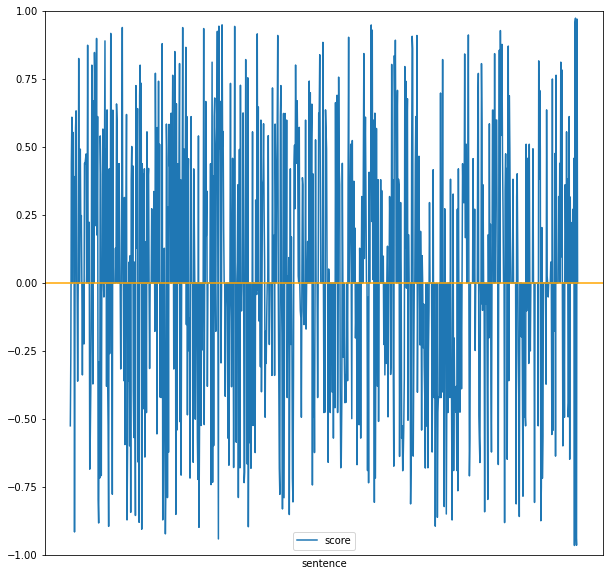

In [209]:
novel_df.plot(x='sentence', y='score', figsize=(10,10), ylim=[-1,1])

# Plot a horizontal line at 0
plt.axhline(y=0, color='orange', linestyle='-')

# Remove the x label and tick labels
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)

In [228]:
novel_df['rolling_mean'] = novel_df['neg'].rolling(60).mean()

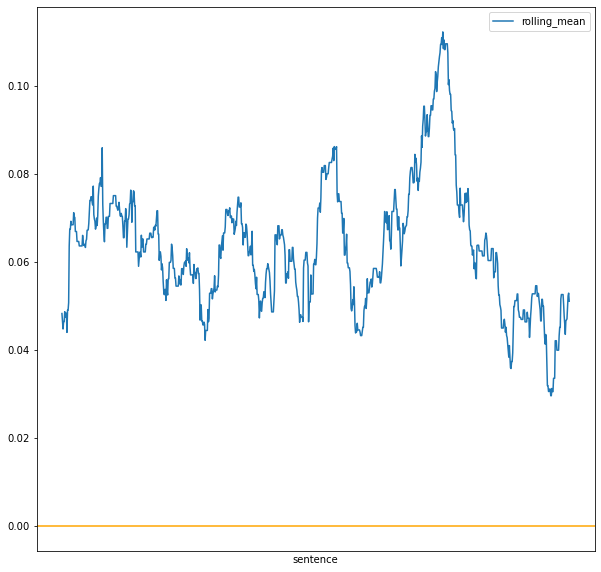

In [229]:
novel_df.plot(x='sentence', y='rolling_mean', figsize=(10,10))

# Plot a horizontal line at 0
plt.axhline(y=0, color='orange', linestyle='-')

# Remove the x label and tick labels
plt.tick_params(
    axis='x',          # changes apply to the x-axis
    which='both',      # both major and minor ticks are affected
    bottom=False,      # ticks along the bottom edge are off
    top=False,         # ticks along the top edge are off
    labelbottom=False)

### Make a Plot Arc

In [223]:
novel_df.groupby('chapter_title')['score'].median()

chapter_title
CHAPTER I. Down the Rabbit-Hole                    0.0
CHAPTER II. The Pool of Tears                      0.0
CHAPTER III. A Caucus-Race and a Long Tale         0.0
CHAPTER IV. The Rabbit Sends in a Little Bill      0.0
CHAPTER IX. The Mock Turtle’s Story                0.0
CHAPTER V. Advice from a Caterpillar               0.0
CHAPTER VI. Pig and Pepper                         0.0
CHAPTER VII. A Mad Tea-Party                       0.0
CHAPTER VIII. The Queen’s Croquet-Ground           0.0
CHAPTER X. The Lobster Quadrille                   0.0
CHAPTER XI. Who Stole the Tarts?                   0.0
CHAPTER XII. Alice’s Evidence                      0.0
Name: score, dtype: float64

In [214]:
chapter_means = novel_df.groupby('chapter_title')['score'].max().reset_index()

#### Bar Chart

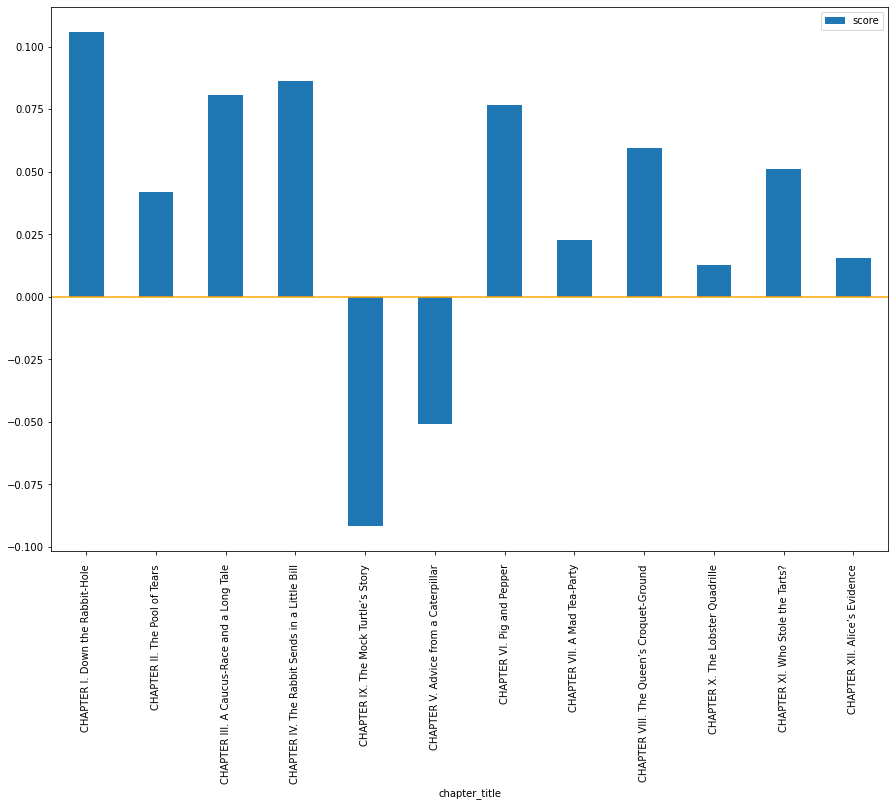

In [215]:
ax = chapter_means.plot(x='chapter_title', y='score',
                          kind='bar', figsize=(15,10),rot=90)

# Plot a horizontal line at 0
plt.axhline(y=0, color='orange', linestyle='-')

#### Line Chart

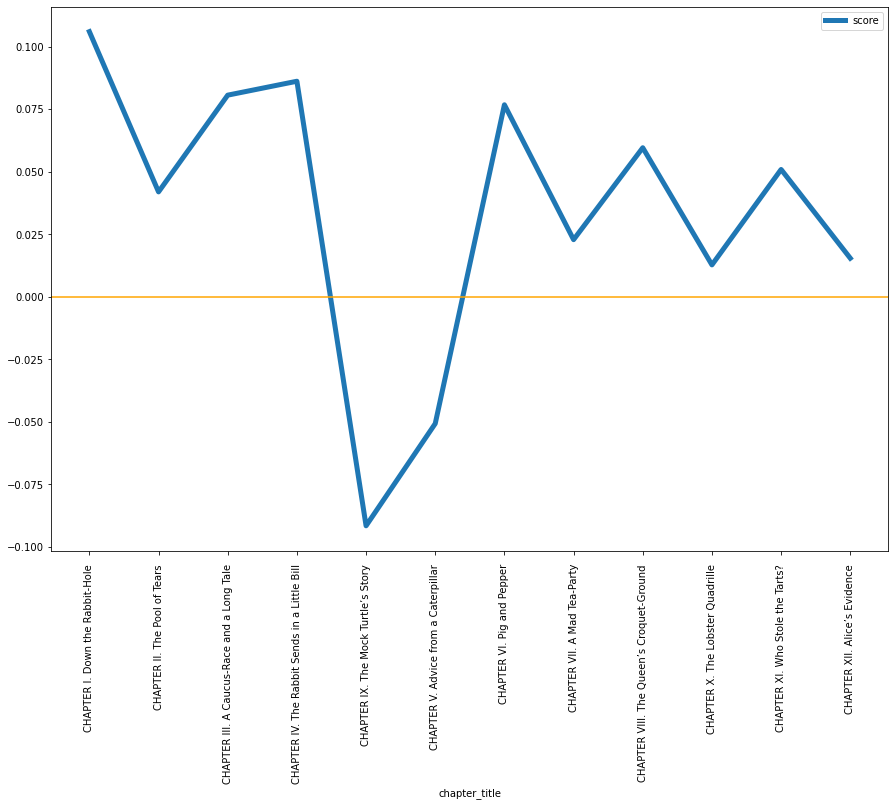

In [218]:
ax = chapter_means.plot(x='chapter_title', y='score', figsize=(15,10), rot=90, linewidth=5)

number_of_chapters = 12
#Not all xtick labels will show up in a line plot by default, so we have to make it explicit
ax.set_xticks(range(0, number_of_chapters))
ax.set_xticklabels(chapter_means['chapter_title'].unique())

# Plot a horizontal line at 0
plt.axhline(y=0, color='orange', linestyle='-')
plt.show()

In [219]:
novel_df[novel_df['chapter_title'].str.contains('Mock')].sort_index()[-20:]

,chapter_title,sentence,score,rolling_mean
706,CHAPTER IX. The Mock Turtle’s Story,"“Yes,” said Alice, “we learned French and music.” “And washing?” said the Mock Turtle.",-0.4215,-0.119673
707,CHAPTER IX. The Mock Turtle’s Story,“Certainly not!” said Alice indignantly.,0.0000,-0.119673
708,CHAPTER IX. The Mock Turtle’s Story,“Ah!,0.0000,-0.106127
709,CHAPTER IX. The Mock Turtle’s Story,"then yours wasn’t a really good school,” said the Mock Turtle in a tone of great relief.",0.8221,-0.081638
710,CHAPTER IX. The Mock Turtle’s Story,"“Now at _ours_ they had at the end of the bill, ‘French, music, _and washing_—extra.’” “You couldn’t have wanted it much,” said Alice; “living at the bottom of the sea.” “I couldn’t afford to learn it.” said the Mock Turtle with a sigh.",-0.4019,-0.095677
711,CHAPTER IX. The Mock Turtle’s Story,“I only took the regular course.” “What was that?” inquired Alice.,0.0000,-0.110805
712,CHAPTER IX. The Mock Turtle’s Story,"“Reeling and Writhing, of course, to begin with,” the Mock Turtle replied; “and then the different branches of Arithmetic—Ambition, Distraction, Uglification, and Derision.” “I never heard of ‘Uglification,’” Alice ventured to say.",-0.8225,-0.138883
713,CHAPTER IX. The Mock Turtle’s Story,“What is it?” The Gryphon lifted up both its paws in surprise.,0.2732,-0.123715
714,CHAPTER IX. The Mock Turtle’s Story,“What!,0.0000,-0.118157
715,CHAPTER IX. The Mock Turtle’s Story,Never heard of uglifying!” it exclaimed.,0.0000,-0.118157


Examine a different chapter

In [302]:
chapter_df[chapter_df['chapter'].str.contains('INSERT-PART-OF-CHAPTER-NAME')]

,chapter,sentence,compound_score,negative_score
383,39-Red-Clowns,The tilt-a-whirl.,0.0000,0.000
384,39-Red-Clowns,The red clowns laughing their thick-tongue laugh.,0.7783,0.000
362,39-Red-Clowns,"I waited by the red clowns, just like you said, but you never came, you never came for me.",0.1901,0.000
381,39-Red-Clowns,"Only his dirty fingernails against my skin, only his sour smell again.",-0.4404,0.209
380,39-Red-Clowns,"All the books and magazines, everything that told it wrong.",-0.4767,0.256
379,39-Red-Clowns,They all lied.,-0.3818,0.565
378,39-Red-Clowns,You’re a liar.,-0.5106,0.623
377,39-Red-Clowns,I waited my whole life.,0.0000,0.000
376,39-Red-Clowns,Why did you leave me all alone?,-0.2960,0.390
373,39-Red-Clowns,I don’t remember.,0.0000,0.000
